# Faster R-CNN Model (Detectron2)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Adding Detectron2 to Collab

### Importing Libraries

In [ ]:
!pip install pyyaml==5.1
!pip install torch==1.8.0+cu101 torchvision==0.9.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 8.1 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=4d20c261b58f144f88fc16f828e1240db4e305cacd5c55295f5f05a72f2c9783
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 763.5 MB 14 kB/s 
     |████████████████████████████████| 17.3 MB 1.1 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.11.0+cu113
    Uninstalling torch-1.11.0+cu113:


In [ ]:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
     |████████████████████████████████| 6.3 MB 6.1 MB/s 
     |████████████████████████████████| 50 kB 4.0 MB/s 
     |████████████████████████████████| 151 kB 17.9 MB/s 
     |████████████████████████████████| 79 kB 7.0 MB/s 
     |████████████████████████████████| 130 kB 59.2 MB/s 
     |████████████████████████████████| 749 kB 71.4 MB/s 
     |████████████████████████████████| 843 kB 53.0 MB/s 
     |████████████████████████████████| 117 kB 62.2 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220512-py3-none-any.whl size=61288 sha256=2548949ccd90860fd6082aa95e680c0f84b55d93517c3482411513ff4cd24ec0
  Stored in directory: /root/.cache/pip/wheels/68/20/f9/a11a0dd63f4c13678b2a5ec488e48078756505c7777b75b29e
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9

In [ ]:
import torch
assert torch.__version__.startswith("1.8")
import torchvision
import cv2

In [ ]:
import os
import numpy as np
import json
import random
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

%matplotlib inline
from detectron2.structures import BoxMode
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances, load_coco_json
from detectron2.utils.visualizer import Visualizer

In [ ]:
# Loaded our COCO Dataset
register_coco_instances("my_test_dataset", {}, 
                        "/content/drive/MyDrive/datasets/dataset_rf_coco/test/_annotations.coco.json", 
                        "/content/drive/MyDrive/datasets/dataset_rf_coco/test" )

register_coco_instances("my_training_dataset", {}, 
                        "/content/drive/MyDrive/datasets/dataset_rf_coco/train/_annotations.coco.json", 
                        "/content/drive/MyDrive/datasets/dataset_rf_coco/train")

dataset_dict_test = load_coco_json(
    "/content/drive/MyDrive/datasets/dataset_rf_coco/test/_annotations.coco.json", 
    "/content/drive/MyDrive/datasets/dataset_rf_coco/test", "test")

dataset_dict_train = load_coco_json(
    "/content/drive/MyDrive/datasets/dataset_rf_coco/train/_annotations.coco.json", 
    "/content/drive/MyDrive/datasets/dataset_rf_coco/train", "train")

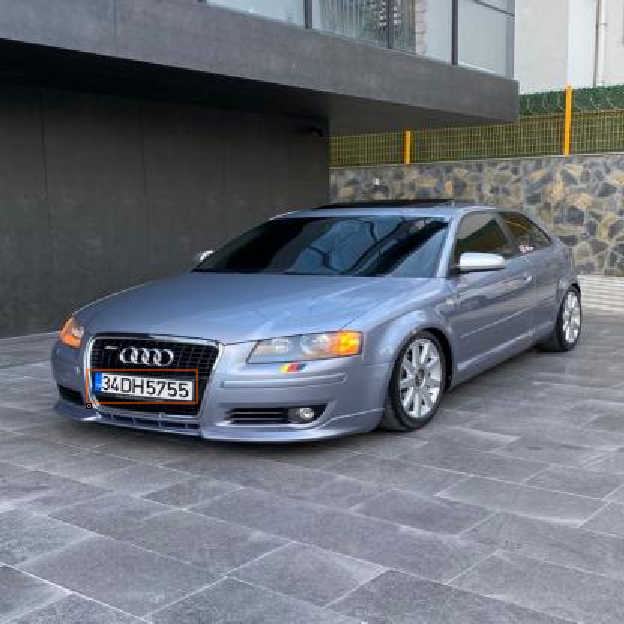

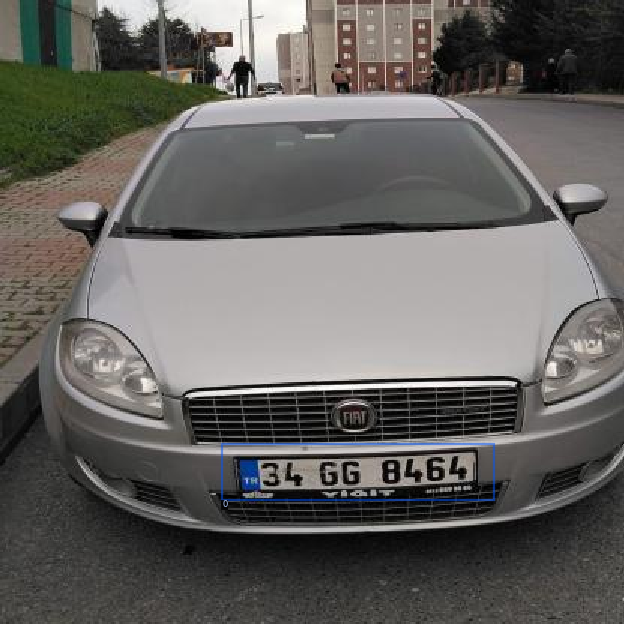

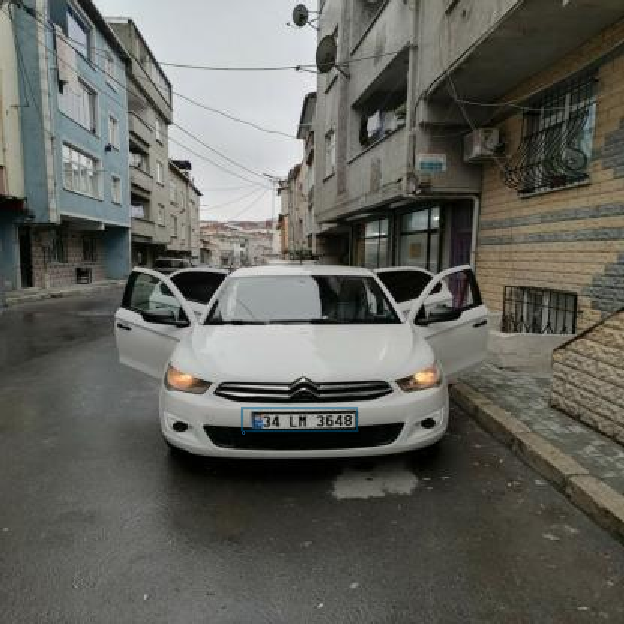

In [ ]:
for d in random.sample(dataset_dict_train, 3):
    # Image
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], scale=1.5)
    # Bounding Box
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import ColorMode
from matplotlib.patches import Rectangle

## Creating Configuration File

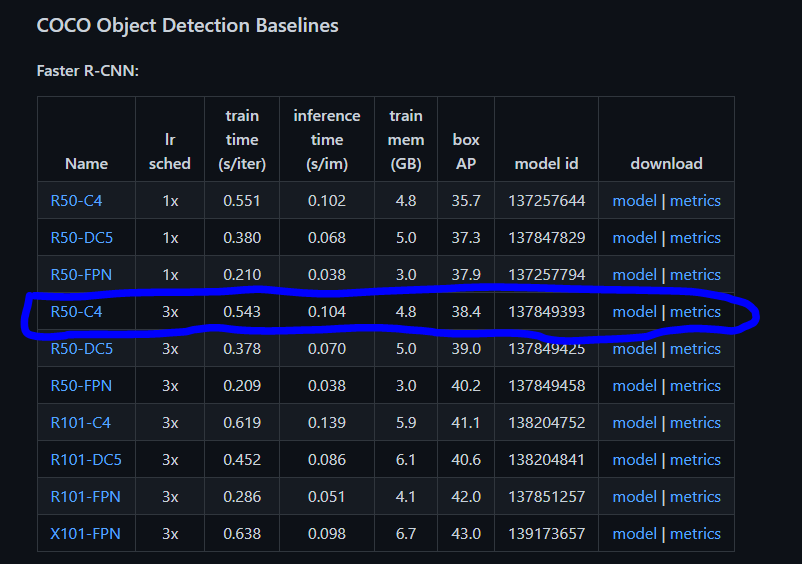

**C4:** Use a ResNet conv4 backbone with conv5 head. The original baseline in the Faster R-CNN paper.

In [ ]:
# Creating Config File
cfg = get_cfg()   
# Fetchs config file and adds into our config file
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_C4_3x.yaml"))
# Adds training data into our config file
cfg.DATASETS.TRAIN = ("my_training_dataset",)
# Adds testing data into our config file
cfg.DATASETS.TEST = ("my_test_dataset",)
# Number of workers
cfg.DATALOADER.NUM_WORKERS = 4
# Fetches weight file and adds into our config file
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_C4_3x.yaml")
# Batch Size
cfg.SOLVER.IMS_PER_BATCH = 4  
# Learning Rate
cfg.SOLVER.BASE_LR = 0.001  
# Number of iterations required to decay Learning Rate  (zero by default)
cfg.SOLVER.STEPS = []      

# Batch Size per Image
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128  



cfg.MODEL.DEVICE = "cuda"
# Number of Iterations (epoch-like)
cfg.SOLVER.MAX_ITER = 500    
# Number of classes (only for because we're only training to find license plate)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  

In [ ]:
# Create a file for our model output
cfg.OUTPUT_DIR = "/content/drive/MyDrive/output_dt"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
# Turns the model into a training mode with the config file
trainer = DefaultTrainer(cfg) 
# giving resume false means training our model from the strach
trainer.resume_or_load(resume=False)

[05/29 21:19:50 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 2048) in the checkpoint but (2, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 2048) in th

In [ ]:
# Training starts
trainer.train()

[05/29 21:19:57 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[05/29 21:20:17 d2.utils.events]:  eta: 0:07:45  iter: 19  total_loss: 0.913  loss_cls: 0.648  loss_box_reg: 0.08312  loss_rpn_cls: 0.1857  loss_rpn_loc: 0.01426  time: 0.9667  data_time: 0.0337  lr: 3.8962e-05  max_mem: 3133M
[05/29 21:20:37 d2.utils.events]:  eta: 0:07:34  iter: 39  total_loss: 0.6202  loss_cls: 0.2818  loss_box_reg: 0.1204  loss_rpn_cls: 0.1865  loss_rpn_loc: 0.01575  time: 0.9878  data_time: 0.0191  lr: 7.8922e-05  max_mem: 3133M
[05/29 21:20:58 d2.utils.events]:  eta: 0:07:23  iter: 59  total_loss: 0.4532  loss_cls: 0.1802  loss_box_reg: 0.1137  loss_rpn_cls: 0.1264  loss_rpn_loc: 0.01228  time: 1.0072  data_time: 0.0175  lr: 0.00011888  max_mem: 3133M
[05/29 21:21:20 d2.utils.events]:  eta: 0:07:10  iter: 79  total_loss: 0.4718  loss_cls: 0.1649  loss_box_reg: 0.193  loss_rpn_cls: 0.09845  loss_rpn_loc: 0.01307  time: 1.0230  data_time: 0.0125  lr: 0.00015884  max_mem: 3133M
[05/29 21:21:40 d2.utils.events]:  eta: 0:06:50  iter: 99  total_loss: 0.422  loss_cls: 0

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model

## Testing Our Testing Dataset Images 

In [ ]:
# Saves weight file to our config file
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  
# Don't draw bounding boxes under 0.7% (Threshold)
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   
#
predictor = DefaultPredictor(cfg)

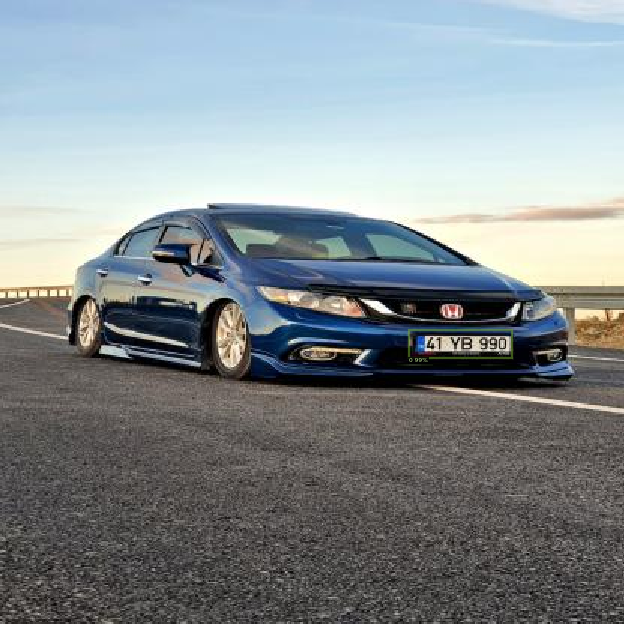

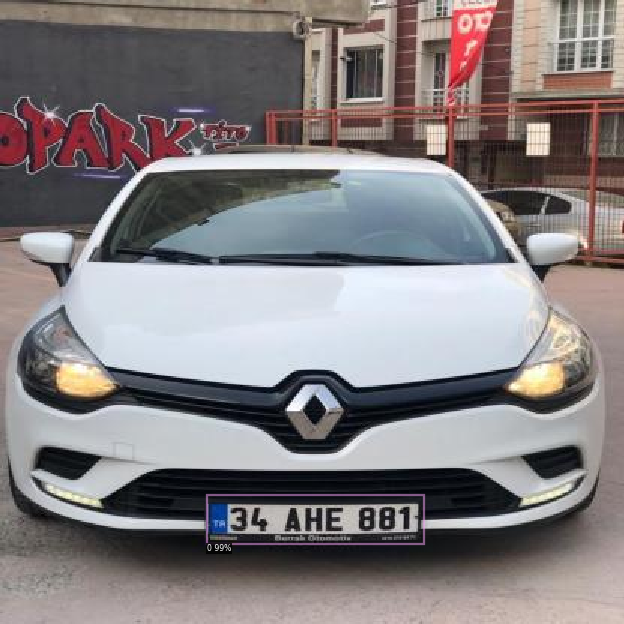

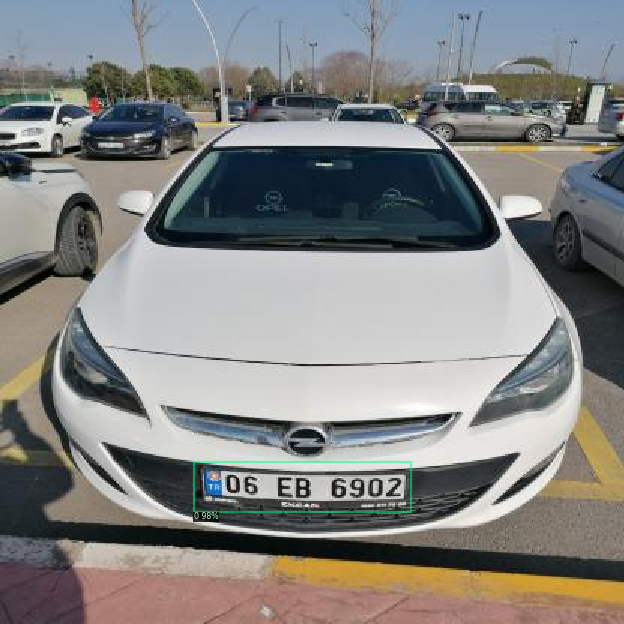

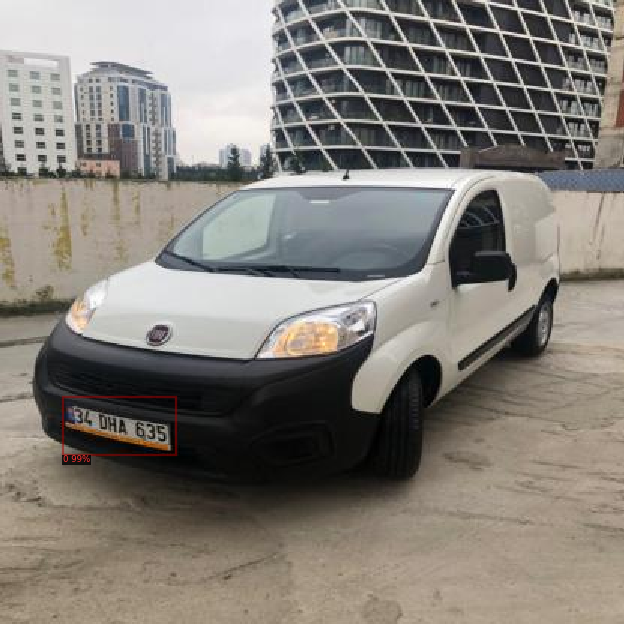

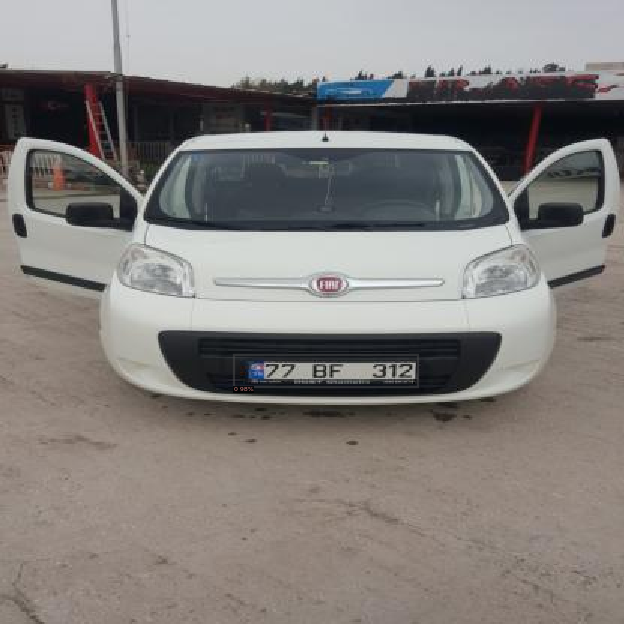

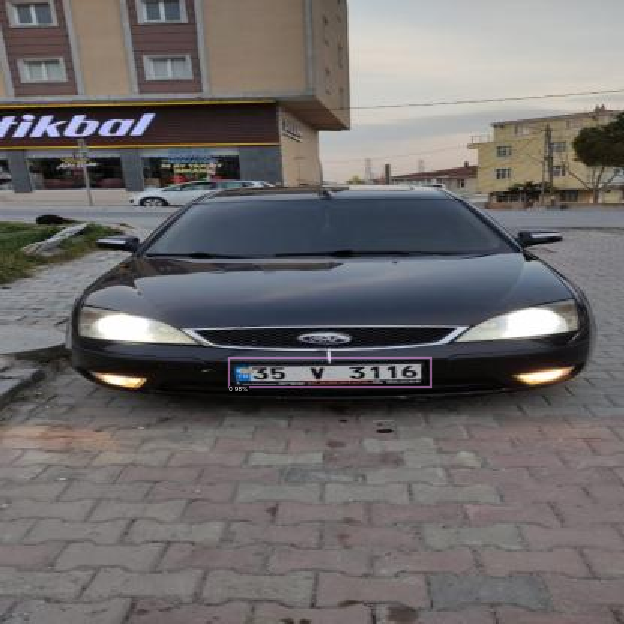

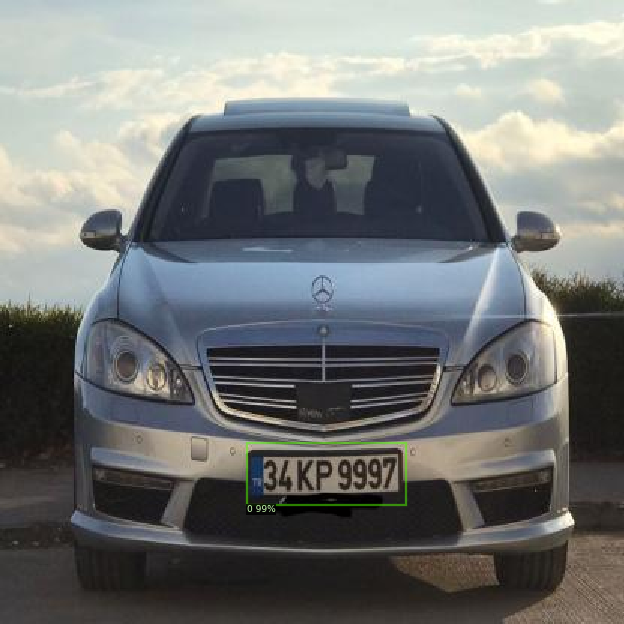

In [ ]:
for d in random.sample(dataset_dict_test, 7):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im) 
    v = Visualizer(im[:, :, ::-1],
                   scale=1.5
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

### Random images I've gathered from Internet

Blind Data

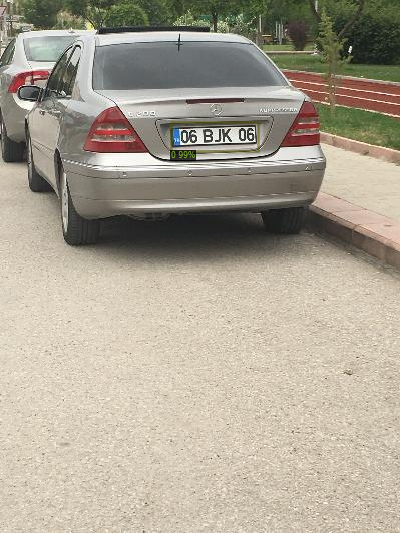

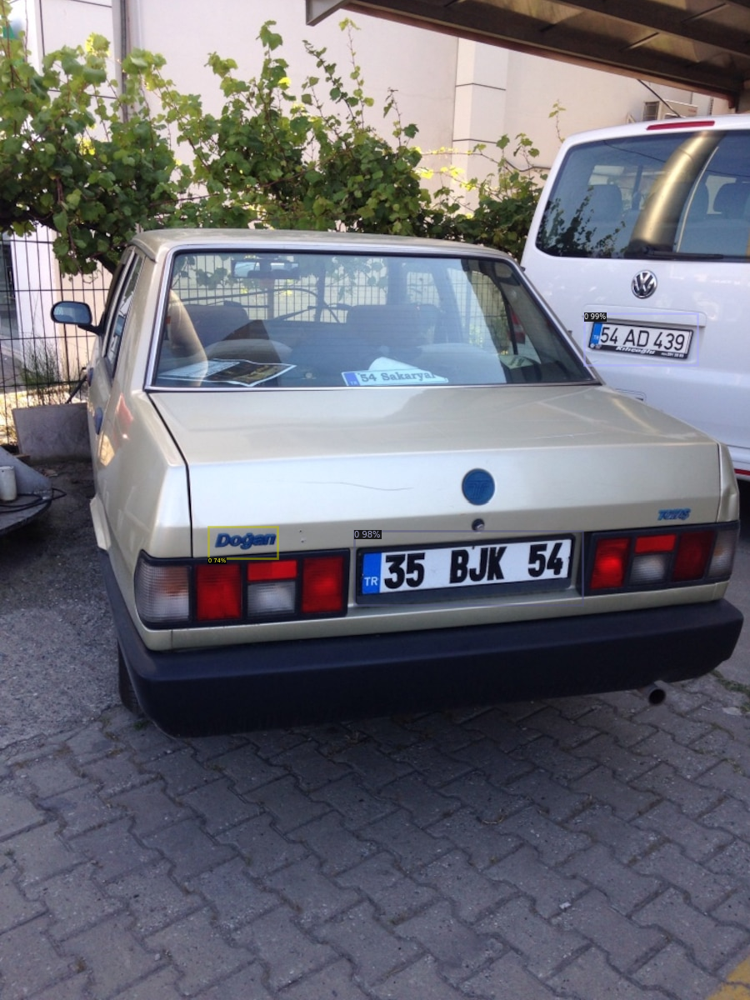

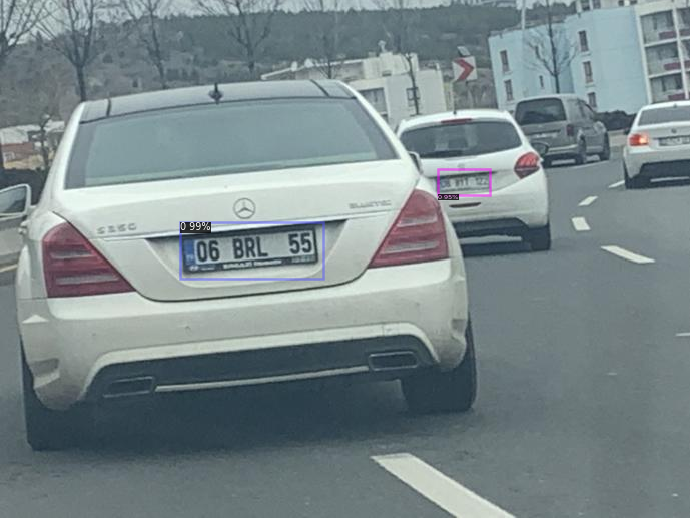

In [ ]:
for d in os.listdir("/content/random_images"):
  im = cv2.imread("/content/random_images/" + d)
  outputs = predictor(im) 
  v = Visualizer(im[:, :, ::-1],
                   scale=1)
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])